In [2]:
#install requirements of yolov5
%cd /content/drive/MyDrive/yolov5_class
%pip install -qr requirements.txt

/content/drive/MyDrive/yolov5_class
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 11.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.6 MB/s eta 0:00:00


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import torch
import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 2023-4-9 Python-3.10.11 torch-2.0.0+cu118 CPU


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 23.4/107.7 GB disk)


In [ ]:
%cd ../yolov5_class
from utils.downloads import attempt_download

p5 = ['n', 's', 'm', 'l', 'x']  # P5 models
cls = [f'{x}-cls' for x in p5]  # classification models

for x in cls:
    attempt_download(f'weights/yolov5{x}.pt')

/content/drive/MyDrive/yolov5_class


100%|██████████| 4.87M/4.87M [00:00<00:00, 60.7MB/s]

100%|██████████| 10.5M/10.5M [00:00<00:00, 54.3MB/s]

100%|██████████| 24.9M/24.9M [00:00<00:00, 57.4MB/s]

100%|██████████| 50.9M/50.9M [00:01<00:00, 51.8MB/s]

100%|██████████| 92.0M/92.0M [00:01<00:00, 89.6MB/s]



In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
#img = mpimg.imread("/content/drive/MyDrive/tomato_except2/data/user_feed/rotten01.jpg")
img = mpimg.imread("/content/drive/MyDrive/yolov5_class/test/test01.jpg")
plt.imshow(img)
plt.show()

In [ ]:
import pandas as pd

# Read CSV file into a pandas dataframe
df = pd.read_csv('/content/drive/MyDrive/yolov5_class/runs/train-cls/exp3/results.csv')

# Display the first few rows of the dataframe
print(df.head())


                     epoch               train/loss               valid/loss  \
0                        0                  0.83332                  1.14720   
1                        1                  0.67282                  1.34650   
2                        2                  0.60965                  0.79540   
3                        3                  0.57098                  0.66864   
4                        4                  0.53654                  0.76600   

     metrics/accuracy_top1    metrics/accuracy_top5                     lr/0  
0                  0.33333                        1                 0.000099  
1                  0.35000                        1                 0.000098  
2                  0.61778                        1                 0.000097  
3                  0.76222                        1                 0.000096  
4                  0.72444                        1                 0.000095  


In [ ]:
logger = 'TensorBoard' #@param ['ClearML', 'Comet', 'TensorBoard']

if logger == 'ClearML':
  %pip install -q clearml
  import clearml; clearml.browser_login()
elif logger == 'Comet':
  %pip install -q comet_ml
  import comet_ml; comet_ml.init()
elif logger == 'TensorBoard':
  %load_ext tensorboard
  %tensorboard --logdir runs/train-cls

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
!python classify/train.py --model yolov5m-cls.pt --imgsz 224 --batch-size 128 --epochs 100 --data /content/drive/MyDrive/class_image_tomato --pretrained weights/yolov5m-cls.pt

classify/train: model=yolov5m-cls.pt, data=/content/drive/MyDrive/class_image_tomato, epochs=100, batch_size=128, imgsz=224, nosave=False, cache=None, device=, workers=8, project=runs/train-cls, name=exp, exist_ok=False, pretrained=weights/yolov5m-cls.pt, optimizer=Adam, lr0=0.0001, decay=5e-05, label_smoothing=0.1, cutoff=None, dropout=0.1, verbose=False, seed=0, local_rank=-1
github: skipping check (not a git repository), for updates see https://github.com/ultralytics/yolov5
YOLOv5 🚀 2023-4-9 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

TensorBoard: Start with 'tensorboard --logdir runs/train-cls', view at http://localhost:6006/
albumentations: RandomResizedCrop(p=1.0, height=224, width=224, scale=(0.08, 1.0), ratio=(0.75, 1.3333333333333333), interpolation=1), HorizontalFlip(p=0.5), ColorJitter(p=0.5, brightness=[0.6, 1.4], contrast=[0.6, 1.4], saturation=[0.6, 1.4], hue=[0, 0]), Normalize(p=1.0, mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=

In [ ]:
!python classify/val.py --weights runs/train-cls/exp3/weights/best.pt --imgsz 224 --data /content/drive/MyDrive/class_image_tomato

classify/val: data=/content/drive/MyDrive/class_image_tomato, weights=['runs/train-cls/exp3/weights/best.pt'], batch_size=128, imgsz=224, device=, workers=8, verbose=True, project=runs/val-cls, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 2023-4-9 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 166 layers, 11670035 parameters, 0 gradients, 30.6 GFLOPs
testing: 100% 8/8 [05:23<00:00, 40.43s/it]
                   Class      Images    top1_acc    top5_acc
                     all         900       0.984           1
          at_risk_tomato         300       0.973           1
            fresh_tomato         300           1           1
           rotten_tomato         300        0.98           1
Speed: 0.1ms pre-process, 1.1ms inference, 0.0ms post-process per image at shape (1, 3, 224, 224)
Results saved to runs/val-cls/exp4


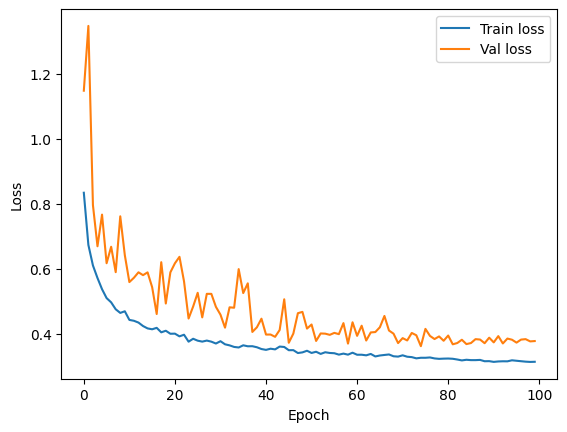

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Read CSV file into a pandas dataframe
df = pd.read_csv('/content/drive/MyDrive/yolov5_class/runs/train-cls/exp3/results.csv')

# Plot a line graph with epoch on the x-axis and train/loss and test/loss on the y-axis
plt.plot(df['                  epoch'], df['             train/loss'], label='Train loss')
plt.plot(df['                  epoch'], df['             valid/loss'], label='Val loss')

# Add axis labels and legend
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Display the graph
plt.show()

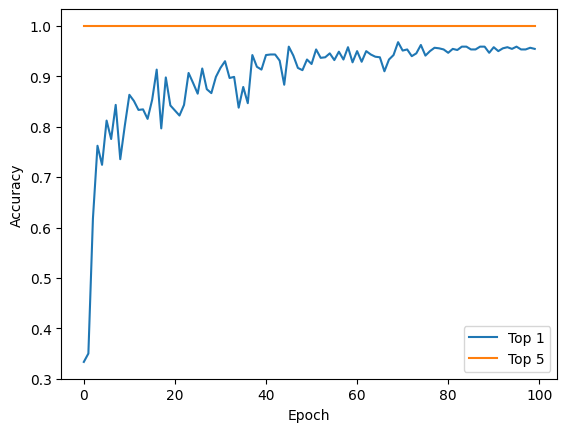

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Read CSV file into a pandas dataframe
df = pd.read_csv('/content/drive/MyDrive/yolov5_class/runs/train-cls/exp3/results.csv')

# Plot a line graph with epoch on the x-axis and train/loss and test/loss on the y-axis
plt.plot(df['                  epoch'], df['  metrics/accuracy_top1'], label='Top 1')
plt.plot(df['                  epoch'], df['  metrics/accuracy_top5'], label='Top 5')

# Add axis labels and legend
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Display the graph
plt.show()

Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 2023-4-9 Python-3.9.16 torch-2.0.0+cu118 CPU

Fusing layers... 
Model summary: 166 layers, 11670035 parameters, 0 gradients, 30.6 GFLOPs
WARNING ⚠️ YOLOv5 ClassificationModel is not yet AutoShape compatible. You must pass torch tensors in BCHW to this model, i.e. shape(1,3,224,224).


Accuracy:  0.9844444444444445
Recall at_risk_tomato:  0.9733333333333334
Precision at_risk_tomato:  0.9733333333333334
F1-Score at_risk_tomato:  0.9831649831649831
Recall fresh_tomato:  1.0
Precision fresh_tomato:  1.0
F1-Score fresh_tomato:  0.9852216748768473
Recall rotten_tomato:  0.98
Precision rotten_tomato:  0.98
F1-Score rotten_tomato:  0.9849246231155778
Confusion Matrix: 
 [[292   5   3]
 [  0 300   0]
 [  2   4 294]]


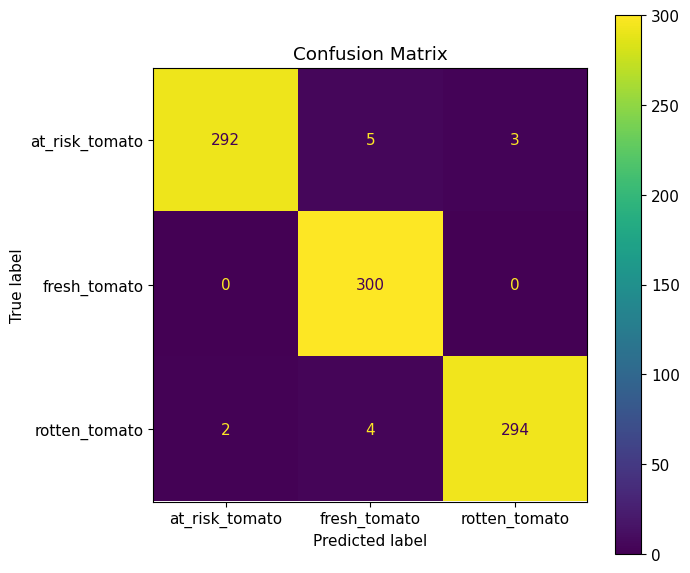

In [ ]:
import torch
import torchvision
from torchvision import transforms
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from IPython.display import display
import numpy as np
import matplotlib.pyplot as plt

# Define the transforms to apply to the images
transform = transforms.Compose([transforms.Resize((224, 224)),
                                transforms.ToTensor(),
                                transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))])

# Load the test set
testset = torchvision.datasets.ImageFolder(root='/content/drive/MyDrive/class_image_tomato/test/', transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=128, shuffle=False)

# Load the YOLOv5 model
#model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/yolov5_class/runs/train-cls/exp3/weights/best.pt')

# Initialize variables for calculating evaluation metrics
y_true = []
y_pred = []

# Loop over test dataset and generate predictions
for image, label in testloader:
  
    # Generate prediction
    result = model(image)

    # Extract predicted class label
    predicted_labels = torch.argmax(result, dim=1).numpy()

    # Append true and predicted labels to lists
    y_true.append(label.numpy())
    y_pred.append(predicted_labels)

# Concatenate the list of predicted labels and true labels
y_true = np.concatenate(y_true)
y_pred = np.concatenate(y_pred)

# Define the class names
class_names = ['at_risk_tomato', 'fresh_tomato', 'rotten_tomato']

# Calculate evaluation metrics
accuracy = np.mean(np.array(y_true) == np.array(y_pred))
#report = confusion_matrix(y_true, y_pred, labels=np.arange(len(class_names)), normalize='true')

report = classification_report(y_true, y_pred)
cm = confusion_matrix(y_true, y_pred)

# Extract recall, precision and f1-score from classification report
report = classification_report(y_true, y_pred, target_names=class_names, output_dict=True)
recall_class_1 = report['at_risk_tomato']['recall']
precision_class_1 = report['at_risk_tomato']['precision']
f1_score_class_1 = report['at_risk_tomato']['f1-score']

recall_class_2 = report['fresh_tomato']['recall']
precision_class_2 = report['fresh_tomato']['precision']
f1_score_class_2 = report['fresh_tomato']['f1-score']

recall_class_3 = report['rotten_tomato']['recall']
precision_class_3 = report['rotten_tomato']['precision']
f1_score_class_3 = report['rotten_tomato']['f1-score']


#metrics = classification_report(y_true, y_pred, output_dict=True)
#recall = metrics['weighted avg']['recall']
#precision = metrics['weighted avg']['precision']
#f1_score = metrics['weighted avg']['f1-score']

# Display results
print("Accuracy: ", accuracy)

print("Recall at_risk_tomato: ", recall_class_1)
print("Precision at_risk_tomato: ", recall_class_1)
print("F1-Score at_risk_tomato: ", f1_score_class_1)


print("Recall fresh_tomato: ", recall_class_2)
print("Precision fresh_tomato: ", recall_class_2)
print("F1-Score fresh_tomato: ", f1_score_class_2)

print("Recall rotten_tomato: ", recall_class_3)
print("Precision rotten_tomato: ", recall_class_3)
print("F1-Score rotten_tomato: ", f1_score_class_3)

print("Confusion Matrix: \n", cm)



# Define the confusion matrix data
#confusion_matrix = np.array([[300, 0, 0],
                    #[0, 300, 0],
                    #[0, 0, 300]])

# Define the labels for the classes
labels = ['at_risk_tomato', 'fresh_tomato', 'rotten_tomato']

# Create a new figure and set its size
fig, ax = plt.subplots(figsize=(7, 7))

# Create a confusion matrix display
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)

# Plot the confusion matrix display
disp.plot(ax=ax)

# Set the title of the plot
ax.set_title("Confusion Matrix")

# Show the plot
plt.show()
display(fig)

In [ ]:
!python classify/predict.py --weights runs/train-cls/exp3/weights/best.pt --imgsz 224 --source '/content/drive/MyDrive/yolov5_class/test/*.jpg'

classify/predict: weights=['runs/train-cls/exp3/weights/best.pt'], source=/content/drive/MyDrive/yolov5_class/test/*.jpg, data=data/coco128.yaml, imgsz=[224, 224], device=, view_img=False, save_txt=False, nosave=False, augment=False, visualize=False, update=False, project=runs/predict-cls, name=exp, exist_ok=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 2023-4-9 Python-3.9.16 torch-2.0.0+cu118 CPU

Fusing layers... 
Model summary: 166 layers, 11670035 parameters, 0 gradients, 30.6 GFLOPs
image 1/9 /content/drive/MyDrive/yolov5_class/test/test01.jpg: 224x224 at_risk_tomato 0.91, rotten_tomato 0.05, fresh_tomato 0.04, 101.5ms
image 2/9 /content/drive/MyDrive/yolov5_class/test/test02.jpg: 224x224 at_risk_tomato 0.91, fresh_tomato 0.05, rotten_tomato 0.04, 84.7ms
image 3/9 /content/drive/MyDrive/yolov5_class/test/test03.jpg: 224x224 at_risk_tomato 0.92, fresh_tomato 0.05, rotten_tomato 0.03, 94.9ms
image 4/9 /content/drive/MyDrive/yolov5_class/test/test04.jpg: 224x224 at_risk_tomato 

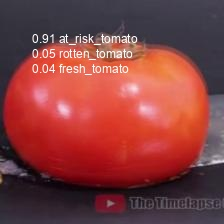

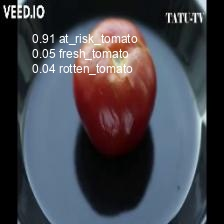

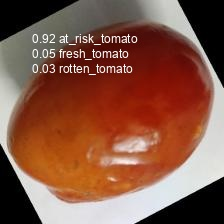

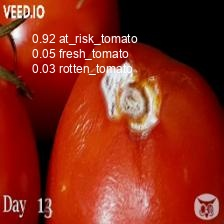

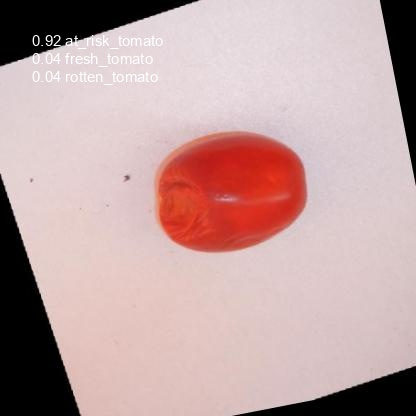

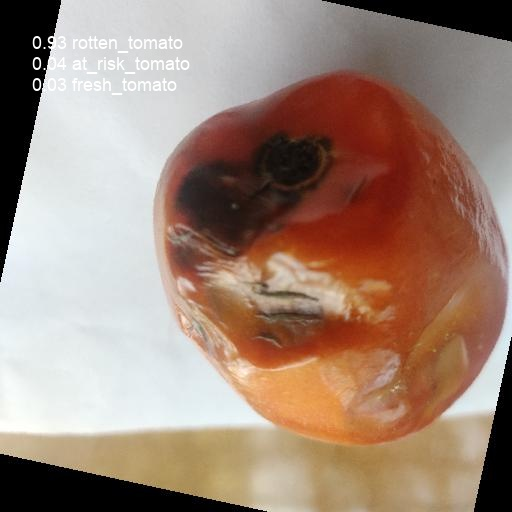

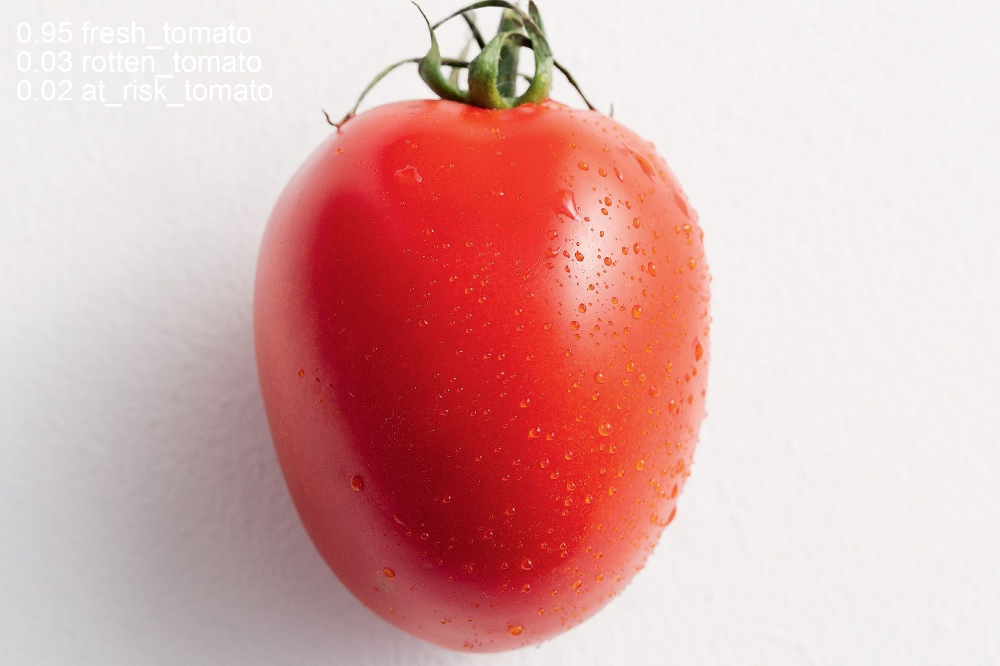

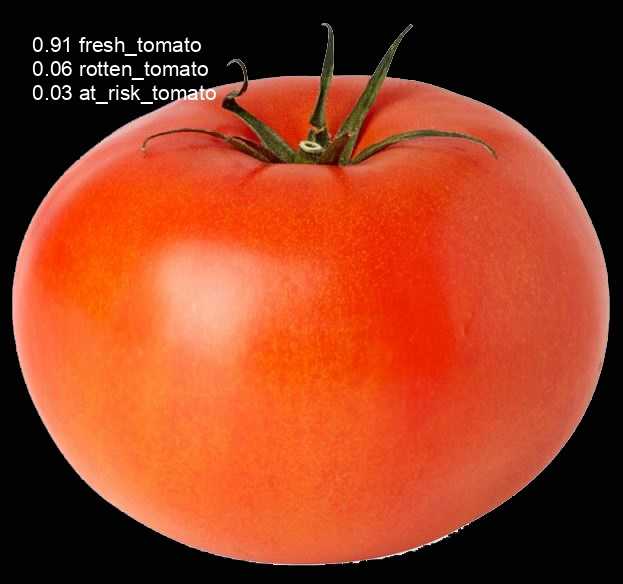

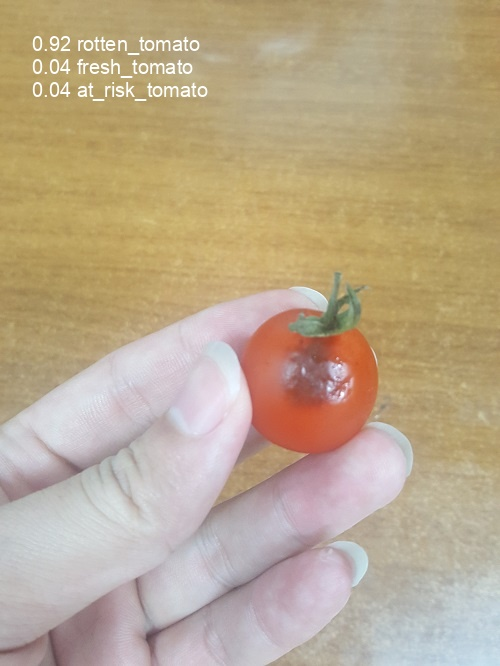

In [ ]:
import glob
from IPython.display import Image, display

i = 0

for imageName in glob.glob('/content/drive/MyDrive/yolov5_class/runs/predict-cls/exp5/*.jpg'):
  i +=1
  if i < 20:
    display(Image(filename=imageName))
    print("\n")

In [ ]:
loaded_obj = torch.load('/content/drive/MyDrive/yolov5_class/runs/train-cls/exp3/weights/best.pt', map_location='cpu')
if isinstance(loaded_obj, dict):
    print("Loaded object is a dictionary")
else:
    print("Loaded object is a PyTorch model")

Loaded object is a dictionary


In [ ]:
import torch
from torch.utils.mobile_optimizer import optimize_for_mobile


#model = torch.load('/content/drive/MyDrive/yolov5_class/runs/train-cls/exp3/weights/best.pt',map_location="cpu")
#model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/yolov5_class/runs/train-cls/exp3/weights/best.pt', force_reload=True)
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/yolov5_class/runs/train-cls/exp3/weights/best.pt')
model.eval()
example = torch.rand(1, 3, 224, 224)
traced_script_module = torch.jit.trace(model, example)
optimized_traced_model = optimize_for_mobile(traced_script_module)
optimized_traced_model._save_for_lite_interpreter("mobile_tomato_model.pt")

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2023-4-9 Python-3.9.16 torch-2.0.0+cu118 CPU

Fusing layers... 
Model summary: 166 layers, 11670035 parameters, 0 gradients, 30.6 GFLOPs
WARNING ⚠️ YOLOv5 ClassificationModel is not yet AutoShape compatible. You must pass torch tensors in BCHW to this model, i.e. shape(1,3,224,224).


In [ ]:
!python classify/train.py --model yolov5m-cls.pt --imgsz 224 --batch-size 128 --epochs 200 --data /content/drive/MyDrive/class_image_tomato --pretrained weights/yolov5m-cls.pt

classify/train: model=yolov5m-cls.pt, data=/content/drive/MyDrive/class_image_tomato, epochs=200, batch_size=128, imgsz=224, nosave=False, cache=None, device=, workers=8, project=runs/train-cls, name=exp, exist_ok=False, pretrained=weights/yolov5m-cls.pt, optimizer=Adam, lr0=0.0001, decay=5e-05, label_smoothing=0.1, cutoff=None, dropout=0.1, verbose=False, seed=0, local_rank=-1
github: skipping check (not a git repository), for updates see https://github.com/ultralytics/yolov5
YOLOv5 🚀 2023-4-9 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

TensorBoard: Start with 'tensorboard --logdir runs/train-cls', view at http://localhost:6006/
albumentations: RandomResizedCrop(p=1.0, height=224, width=224, scale=(0.08, 1.0), ratio=(0.75, 1.3333333333333333), interpolation=1), HorizontalFlip(p=0.5), ColorJitter(p=0.5, brightness=[0.6, 1.4], contrast=[0.6, 1.4], saturation=[0.6, 1.4], hue=[0, 0]), Normalize(p=1.0, mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=

In [ ]:
!python classify/val.py --weights runs/train-cls/exp5/weights/best.pt --imgsz 224 --data /content/drive/MyDrive/class_image_tomato

classify/val: data=/content/drive/MyDrive/class_image_tomato, weights=['runs/train-cls/exp5/weights/best.pt'], batch_size=128, imgsz=224, device=, workers=8, verbose=True, project=runs/val-cls, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 2023-4-9 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 166 layers, 11670035 parameters, 0 gradients, 30.6 GFLOPs
testing: 100% 8/8 [05:16<00:00, 39.51s/it]
                   Class      Images    top1_acc    top5_acc
                     all         900       0.992           1
          at_risk_tomato         300       0.987           1
            fresh_tomato         300           1           1
           rotten_tomato         300        0.99           1
Speed: 0.1ms pre-process, 1.1ms inference, 0.0ms post-process per image at shape (1, 3, 224, 224)
Results saved to runs/val-cls/exp6


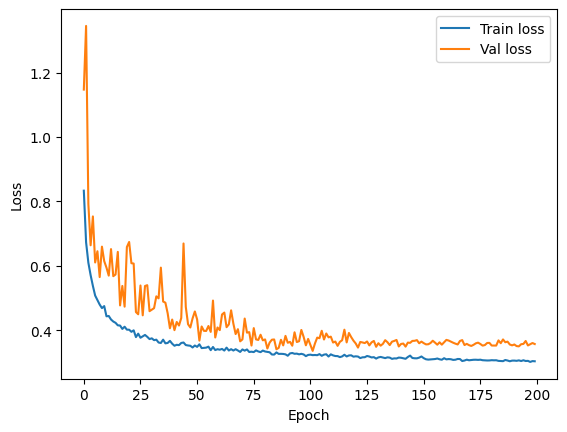

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Read CSV file into a pandas dataframe
df = pd.read_csv('/content/drive/MyDrive/yolov5_class/runs/train-cls/exp5/results.csv')

# Plot a line graph with epoch on the x-axis and train/loss and test/loss on the y-axis
plt.plot(df['                  epoch'], df['             train/loss'], label='Train loss')
plt.plot(df['                  epoch'], df['             valid/loss'], label='Val loss')

# Add axis labels and legend
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Display the graph
plt.show()

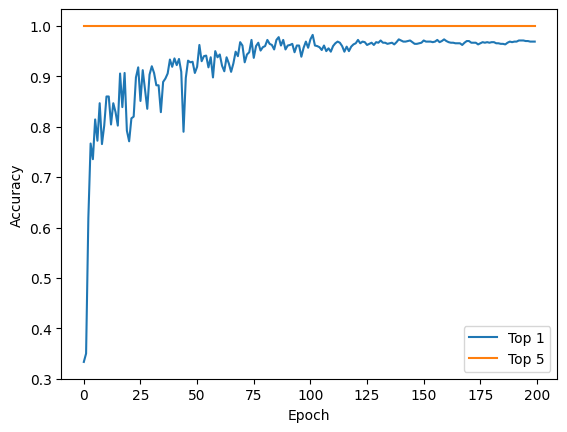

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Read CSV file into a pandas dataframe
df = pd.read_csv('/content/drive/MyDrive/yolov5_class/runs/train-cls/exp5/results.csv')

# Plot a line graph with epoch on the x-axis and train/loss and test/loss on the y-axis
plt.plot(df['                  epoch'], df['  metrics/accuracy_top1'], label='Top 1')
plt.plot(df['                  epoch'], df['  metrics/accuracy_top5'], label='Top 5')

# Add axis labels and legend
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Display the graph
plt.show()

Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 2023-4-9 Python-3.9.16 torch-2.0.0+cu118 CPU

Fusing layers... 
Model summary: 166 layers, 11670035 parameters, 0 gradients, 30.6 GFLOPs
WARNING ⚠️ YOLOv5 ClassificationModel is not yet AutoShape compatible. You must pass torch tensors in BCHW to this model, i.e. shape(1,3,224,224).


Accuracy:  0.9922222222222222
Recall at_risk_tomato:  0.9866666666666667
Precision at_risk_tomato:  0.9866666666666667
F1-Score at_risk_tomato:  0.9932885906040269
Recall fresh_tomato:  1.0
Precision fresh_tomato:  1.0
F1-Score fresh_tomato:  0.9917355371900827
Recall rotten_tomato:  0.99
Precision rotten_tomato:  0.99
F1-Score rotten_tomato:  0.9916527545909849
Confusion Matrix: 
 [[296   2   2]
 [  0 300   0]
 [  0   3 297]]


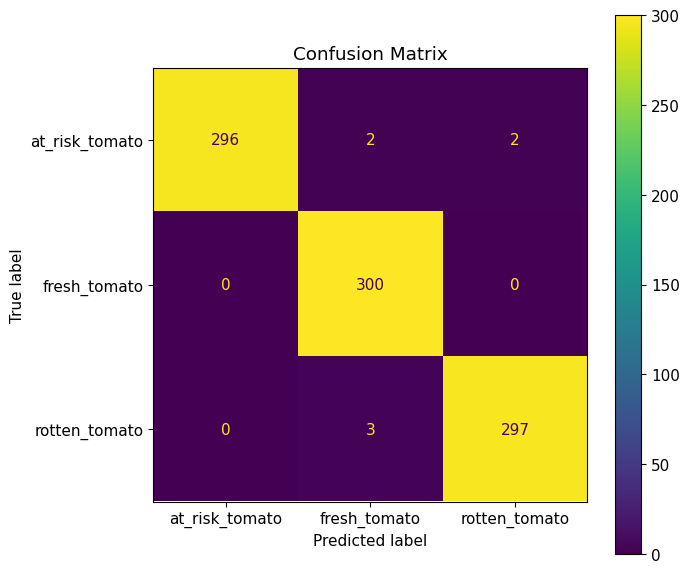

In [ ]:
import torch
import torchvision
from torchvision import transforms
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from IPython.display import display
import numpy as np
import matplotlib.pyplot as plt

# Define the transforms to apply to the images
transform = transforms.Compose([transforms.Resize((224, 224)),
                                transforms.ToTensor(),
                                transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))])

# Load the test set
testset = torchvision.datasets.ImageFolder(root='/content/drive/MyDrive/class_image_tomato/test/', transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=128, shuffle=False)

# Load the YOLOv5 model
#model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/yolov5_class/runs/train-cls/exp5/weights/best.pt')

# Initialize variables for calculating evaluation metrics
y_true = []
y_pred = []

# Loop over test dataset and generate predictions
for image, label in testloader:
  
    # Generate prediction
    result = model(image)

    # Extract predicted class label
    predicted_labels = torch.argmax(result, dim=1).numpy()

    # Append true and predicted labels to lists
    y_true.append(label.numpy())
    y_pred.append(predicted_labels)

# Concatenate the list of predicted labels and true labels
y_true = np.concatenate(y_true)
y_pred = np.concatenate(y_pred)

# Define the class names
class_names = ['at_risk_tomato', 'fresh_tomato', 'rotten_tomato']

# Calculate evaluation metrics
accuracy = np.mean(np.array(y_true) == np.array(y_pred))
#report = confusion_matrix(y_true, y_pred, labels=np.arange(len(class_names)), normalize='true')

report = classification_report(y_true, y_pred)
cm = confusion_matrix(y_true, y_pred)

# Extract recall, precision and f1-score from classification report
report = classification_report(y_true, y_pred, target_names=class_names, output_dict=True)
recall_class_1 = report['at_risk_tomato']['recall']
precision_class_1 = report['at_risk_tomato']['precision']
f1_score_class_1 = report['at_risk_tomato']['f1-score']

recall_class_2 = report['fresh_tomato']['recall']
precision_class_2 = report['fresh_tomato']['precision']
f1_score_class_2 = report['fresh_tomato']['f1-score']

recall_class_3 = report['rotten_tomato']['recall']
precision_class_3 = report['rotten_tomato']['precision']
f1_score_class_3 = report['rotten_tomato']['f1-score']


#metrics = classification_report(y_true, y_pred, output_dict=True)
#recall = metrics['weighted avg']['recall']
#precision = metrics['weighted avg']['precision']
#f1_score = metrics['weighted avg']['f1-score']

# Display results
print("Accuracy: ", accuracy)

print("Recall at_risk_tomato: ", recall_class_1)
print("Precision at_risk_tomato: ", recall_class_1)
print("F1-Score at_risk_tomato: ", f1_score_class_1)


print("Recall fresh_tomato: ", recall_class_2)
print("Precision fresh_tomato: ", recall_class_2)
print("F1-Score fresh_tomato: ", f1_score_class_2)

print("Recall rotten_tomato: ", recall_class_3)
print("Precision rotten_tomato: ", recall_class_3)
print("F1-Score rotten_tomato: ", f1_score_class_3)

print("Confusion Matrix: \n", cm)



# Define the confusion matrix data
#confusion_matrix = np.array([[300, 0, 0],
                    #[0, 300, 0],
                    #[0, 0, 300]])

# Define the labels for the classes
labels = ['at_risk_tomato', 'fresh_tomato', 'rotten_tomato']

# Create a new figure and set its size
fig, ax = plt.subplots(figsize=(7, 7))

# Create a confusion matrix display
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)

# Plot the confusion matrix display
disp.plot(ax=ax)

# Set the title of the plot
ax.set_title("Confusion Matrix")

# Show the plot
plt.show()
display(fig)

In [ ]:
!python classify/predict.py --weights runs/train-cls/exp5/weights/best.pt --imgsz 224 --source '/content/drive/MyDrive/yolov5_class/test/*.jpg'

classify/predict: weights=['runs/train-cls/exp5/weights/best.pt'], source=/content/drive/MyDrive/yolov5_class/test/*.jpg, data=data/coco128.yaml, imgsz=[224, 224], device=, view_img=False, save_txt=False, nosave=False, augment=False, visualize=False, update=False, project=runs/predict-cls, name=exp, exist_ok=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 2023-4-9 Python-3.9.16 torch-2.0.0+cu118 CPU

Fusing layers... 
Model summary: 166 layers, 11670035 parameters, 0 gradients, 30.6 GFLOPs
image 1/9 /content/drive/MyDrive/yolov5_class/test/test01.jpg: 224x224 at_risk_tomato 0.91, rotten_tomato 0.05, fresh_tomato 0.04, 198.6ms
image 2/9 /content/drive/MyDrive/yolov5_class/test/test02.jpg: 224x224 at_risk_tomato 0.92, fresh_tomato 0.04, rotten_tomato 0.04, 172.3ms
image 3/9 /content/drive/MyDrive/yolov5_class/test/test03.jpg: 224x224 at_risk_tomato 0.91, fresh_tomato 0.05, rotten_tomato 0.03, 151.4ms
image 4/9 /content/drive/MyDrive/yolov5_class/test/test04.jpg: 224x224 at_risk_tomat

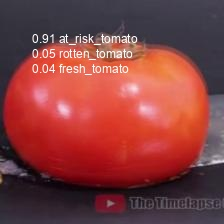

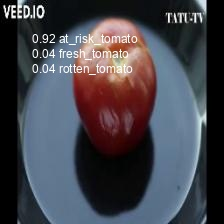

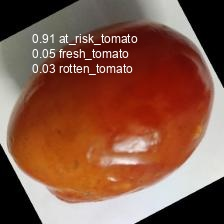

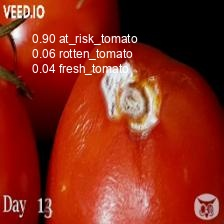

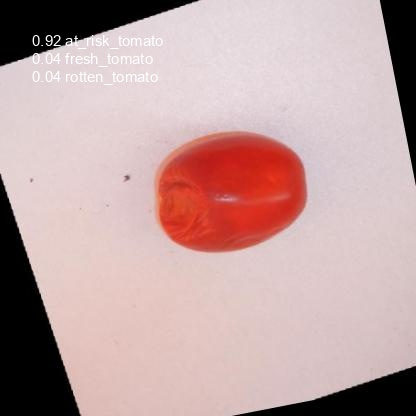

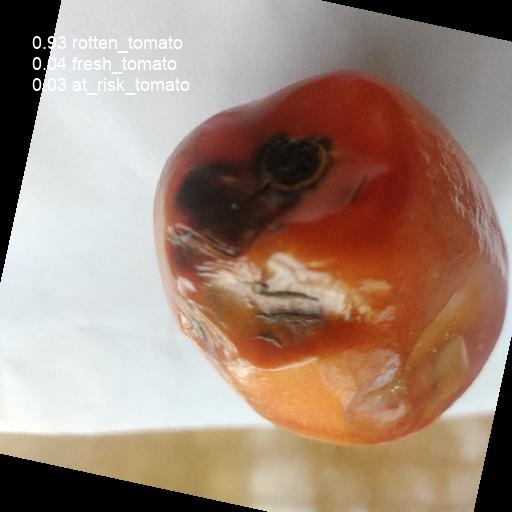

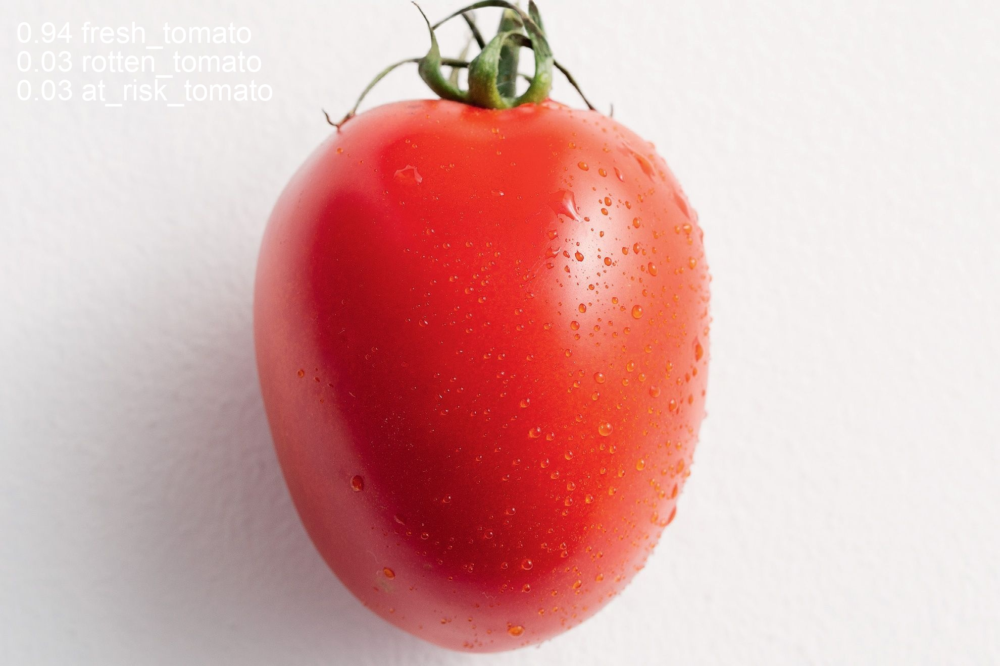

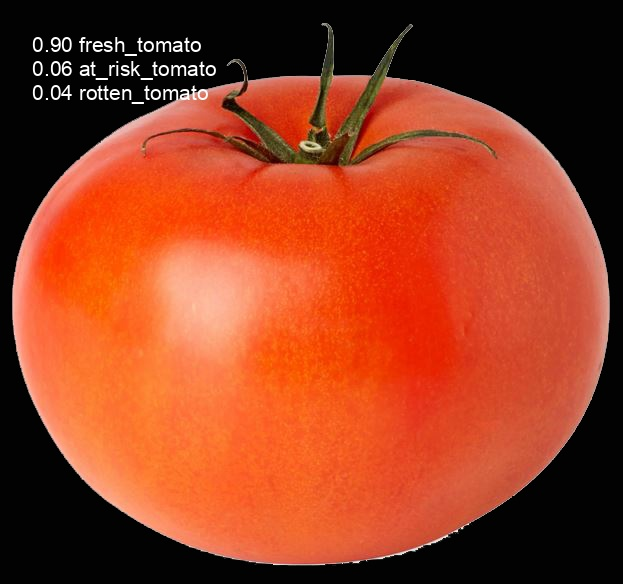

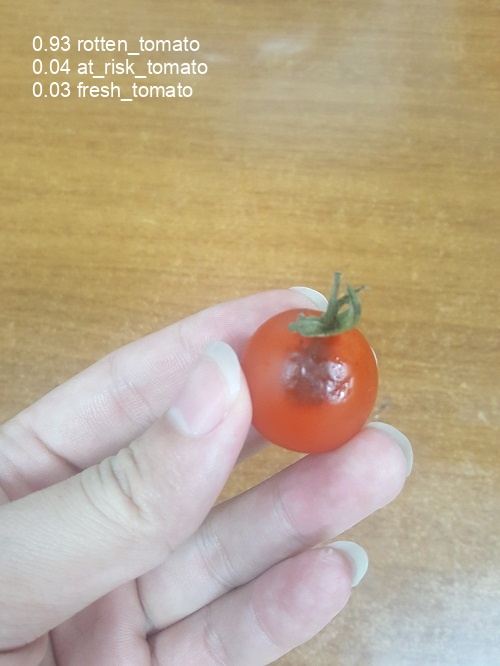

In [ ]:
import glob
from IPython.display import Image, display

i = 0

for imageName in glob.glob('/content/drive/MyDrive/yolov5_class/runs/predict-cls/exp7/*.jpg'):
  i +=1
  if i < 20:
    display(Image(filename=imageName))
    print("\n")

In [ ]:
import torch
from torch.utils.mobile_optimizer import optimize_for_mobile


#model = torch.load('/content/drive/MyDrive/yolov5_class/runs/train-cls/exp3/weights/best.pt',map_location="cpu")
#model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/yolov5_class/runs/train-cls/exp3/weights/best.pt', force_reload=True)
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/yolov5_class/runs/train-cls/exp5/weights/best.pt')
model.eval()
example = torch.rand(1, 3, 224, 224)
traced_script_module = torch.jit.trace(model, example)
optimized_traced_model = optimize_for_mobile(traced_script_module)
optimized_traced_model._save_for_lite_interpreter("new_mobile_tomato_model.pt")

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2023-4-9 Python-3.9.16 torch-2.0.0+cu118 CPU

Fusing layers... 
Model summary: 166 layers, 11670035 parameters, 0 gradients, 30.6 GFLOPs
WARNING ⚠️ YOLOv5 ClassificationModel is not yet AutoShape compatible. You must pass torch tensors in BCHW to this model, i.e. shape(1,3,224,224).


In [ ]:
!python classify/train.py --model yolov5m-cls.pt --imgsz 224 --batch-size 128 --epochs 300 --data /content/drive/MyDrive/class_image_tomato --pretrained weights/yolov5m-cls.pt

classify/train: model=yolov5m-cls.pt, data=/content/drive/MyDrive/class_image_tomato, epochs=300, batch_size=128, imgsz=224, nosave=False, cache=None, device=, workers=8, project=runs/train-cls, name=exp, exist_ok=False, pretrained=weights/yolov5m-cls.pt, optimizer=Adam, lr0=0.0001, decay=5e-05, label_smoothing=0.1, cutoff=None, dropout=0.1, verbose=False, seed=0, local_rank=-1
github: skipping check (not a git repository), for updates see https://github.com/ultralytics/yolov5
YOLOv5 🚀 2023-4-9 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

TensorBoard: Start with 'tensorboard --logdir runs/train-cls', view at http://localhost:6006/
albumentations: RandomResizedCrop(p=1.0, height=224, width=224, scale=(0.08, 1.0), ratio=(0.75, 1.3333333333333333), interpolation=1), HorizontalFlip(p=0.5), ColorJitter(p=0.5, brightness=[0.6, 1.4], contrast=[0.6, 1.4], saturation=[0.6, 1.4], hue=[0, 0]), Normalize(p=1.0, mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value

In [ ]:
!python classify/val.py --weights runs/train-cls/exp6/weights/best.pt --imgsz 224 --data /content/drive/MyDrive/class_image_tomato

classify/val: data=/content/drive/MyDrive/class_image_tomato, weights=['runs/train-cls/exp6/weights/best.pt'], batch_size=128, imgsz=224, device=, workers=8, verbose=True, project=runs/val-cls, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 2023-4-9 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 166 layers, 11670035 parameters, 0 gradients, 30.6 GFLOPs
testing: 100% 8/8 [05:25<00:00, 40.72s/it]
                   Class      Images    top1_acc    top5_acc
                     all         900       0.998           1
          at_risk_tomato         300       0.997           1
            fresh_tomato         300           1           1
           rotten_tomato         300       0.997           1
Speed: 0.1ms pre-process, 1.2ms inference, 0.0ms post-process per image at shape (1, 3, 224, 224)
Results saved to runs/val-cls/exp7


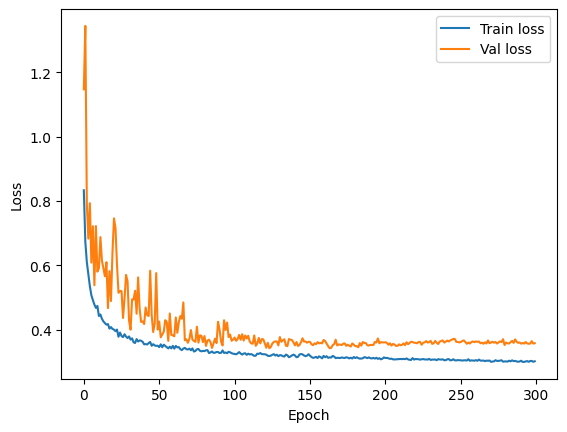

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Read CSV file into a pandas dataframe
df = pd.read_csv('/content/drive/MyDrive/yolov5_class/runs/train-cls/exp6/results.csv')

# Plot a line graph with epoch on the x-axis and train/loss and test/loss on the y-axis
plt.plot(df['                  epoch'], df['             train/loss'], label='Train loss')
plt.plot(df['                  epoch'], df['             valid/loss'], label='Val loss')

# Add axis labels and legend
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Display the graph
plt.show()

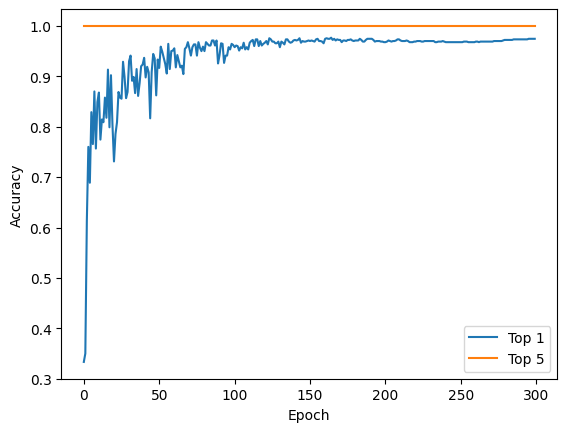

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Read CSV file into a pandas dataframe
df = pd.read_csv('/content/drive/MyDrive/yolov5_class/runs/train-cls/exp6/results.csv')

# Plot a line graph with epoch on the x-axis and train/loss and test/loss on the y-axis
plt.plot(df['                  epoch'], df['  metrics/accuracy_top1'], label='Top 1')
plt.plot(df['                  epoch'], df['  metrics/accuracy_top5'], label='Top 5')

# Add axis labels and legend
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Display the graph
plt.show()

Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 2023-4-9 Python-3.10.11 torch-2.0.0+cu118 CPU

Fusing layers... 
Model summary: 166 layers, 11670035 parameters, 0 gradients, 30.6 GFLOPs
WARNING ⚠️ YOLOv5 ClassificationModel is not yet AutoShape compatible. You must pass torch tensors in BCHW to this model, i.e. shape(1,3,224,224).


Accuracy:  0.9977777777777778
Recall at_risk_tomato:  0.9966666666666667
Precision at_risk_tomato:  0.9966666666666667
F1-Score at_risk_tomato:  0.9983305509181971
Recall fresh_tomato:  1.0
Precision fresh_tomato:  1.0
F1-Score fresh_tomato:  0.9983361064891847
Recall rotten_tomato:  0.9966666666666667
Precision rotten_tomato:  0.9966666666666667
F1-Score rotten_tomato:  0.9966666666666667
Confusion Matrix: 
 [[299   0   1]
 [  0 300   0]
 [  0   1 299]]


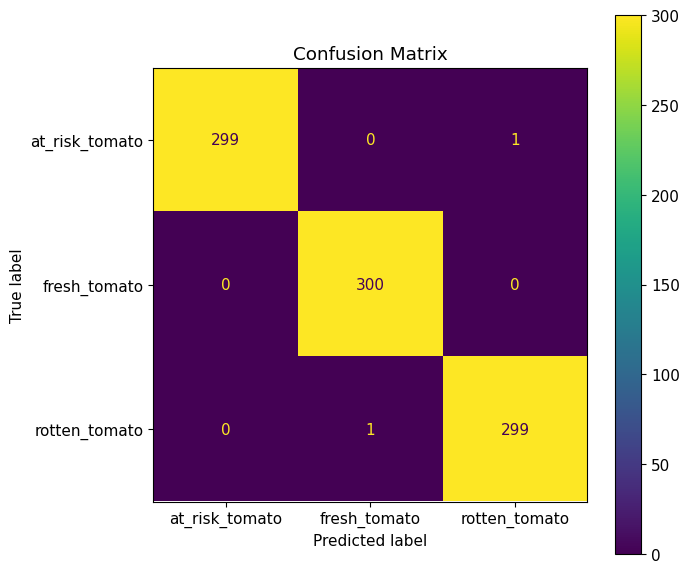

In [ ]:
import torch
import torchvision
from torchvision import transforms
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from IPython.display import display
import numpy as np
import matplotlib.pyplot as plt

# Define the transforms to apply to the images
transform = transforms.Compose([transforms.Resize((224, 224)),
                                transforms.ToTensor(),
                                transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))])

# Load the test set
testset = torchvision.datasets.ImageFolder(root='/content/drive/MyDrive/class_image_tomato/test/', transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=128, shuffle=False)

# Load the YOLOv5 model
#model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/yolov5_class/runs/train-cls/exp6/weights/best.pt')

# Initialize variables for calculating evaluation metrics
y_true = []
y_pred = []

# Loop over test dataset and generate predictions
for image, label in testloader:
  
    # Generate prediction
    result = model(image)

    # Extract predicted class label
    predicted_labels = torch.argmax(result, dim=1).numpy()

    # Append true and predicted labels to lists
    y_true.append(label.numpy())
    y_pred.append(predicted_labels)

# Concatenate the list of predicted labels and true labels
y_true = np.concatenate(y_true)
y_pred = np.concatenate(y_pred)

# Define the class names
class_names = ['at_risk_tomato', 'fresh_tomato', 'rotten_tomato']

# Calculate evaluation metrics
accuracy = np.mean(np.array(y_true) == np.array(y_pred))
#report = confusion_matrix(y_true, y_pred, labels=np.arange(len(class_names)), normalize='true')

report = classification_report(y_true, y_pred)
cm = confusion_matrix(y_true, y_pred)

# Extract recall, precision and f1-score from classification report
report = classification_report(y_true, y_pred, target_names=class_names, output_dict=True)
recall_class_1 = report['at_risk_tomato']['recall']
precision_class_1 = report['at_risk_tomato']['precision']
f1_score_class_1 = report['at_risk_tomato']['f1-score']

recall_class_2 = report['fresh_tomato']['recall']
precision_class_2 = report['fresh_tomato']['precision']
f1_score_class_2 = report['fresh_tomato']['f1-score']

recall_class_3 = report['rotten_tomato']['recall']
precision_class_3 = report['rotten_tomato']['precision']
f1_score_class_3 = report['rotten_tomato']['f1-score']


#metrics = classification_report(y_true, y_pred, output_dict=True)
#recall = metrics['weighted avg']['recall']
#precision = metrics['weighted avg']['precision']
#f1_score = metrics['weighted avg']['f1-score']

# Display results
print("Accuracy: ", accuracy)

print("Recall at_risk_tomato: ", recall_class_1)
print("Precision at_risk_tomato: ", recall_class_1)
print("F1-Score at_risk_tomato: ", f1_score_class_1)


print("Recall fresh_tomato: ", recall_class_2)
print("Precision fresh_tomato: ", recall_class_2)
print("F1-Score fresh_tomato: ", f1_score_class_2)

print("Recall rotten_tomato: ", recall_class_3)
print("Precision rotten_tomato: ", recall_class_3)
print("F1-Score rotten_tomato: ", f1_score_class_3)

print("Confusion Matrix: \n", cm)



# Define the confusion matrix data
#confusion_matrix = np.array([[300, 0, 0],
                    #[0, 300, 0],
                    #[0, 0, 300]])

# Define the labels for the classes
labels = ['at_risk_tomato', 'fresh_tomato', 'rotten_tomato']

# Create a new figure and set its size
fig, ax = plt.subplots(figsize=(7, 7))

# Create a confusion matrix display
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)

# Plot the confusion matrix display
disp.plot(ax=ax)

# Set the title of the plot
ax.set_title("Confusion Matrix")

# Show the plot
plt.show()
display(fig)

In [ ]:
!python classify/predict.py --weights runs/train-cls/exp6/weights/best.pt --imgsz 224 --source '/content/drive/MyDrive/yolov5_class/test/*.jpg'

classify/predict: weights=['runs/train-cls/exp6/weights/best.pt'], source=/content/drive/MyDrive/yolov5_class/test/*.jpg, data=data/coco128.yaml, imgsz=[224, 224], device=, view_img=False, save_txt=False, nosave=False, augment=False, visualize=False, update=False, project=runs/predict-cls, name=exp, exist_ok=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 2023-4-9 Python-3.10.11 torch-2.0.0+cu118 CPU

Fusing layers... 
Model summary: 166 layers, 11670035 parameters, 0 gradients, 30.6 GFLOPs
image 1/9 /content/drive/MyDrive/yolov5_class/test/test01.jpg: 224x224 at_risk_tomato 0.94, rotten_tomato 0.03, fresh_tomato 0.03, 98.4ms
image 2/9 /content/drive/MyDrive/yolov5_class/test/test02.jpg: 224x224 at_risk_tomato 0.93, fresh_tomato 0.03, rotten_tomato 0.03, 87.0ms
image 3/9 /content/drive/MyDrive/yolov5_class/test/test03.jpg: 224x224 at_risk_tomato 0.93, fresh_tomato 0.04, rotten_tomato 0.03, 87.7ms
image 4/9 /content/drive/MyDrive/yolov5_class/test/test04.jpg: 224x224 at_risk_tomato 

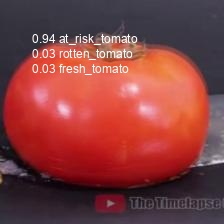

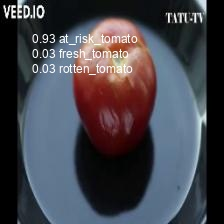

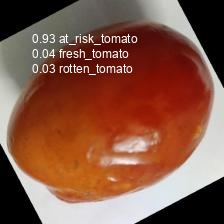

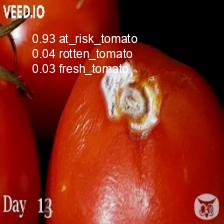

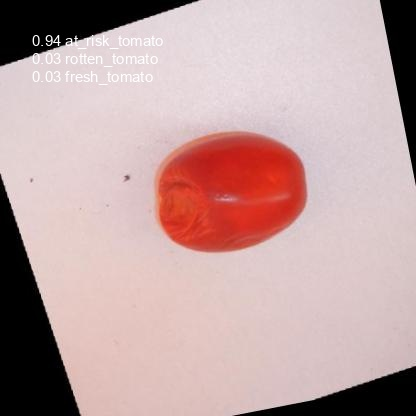

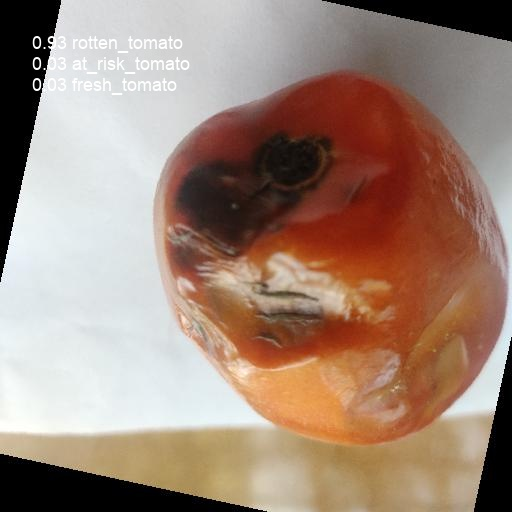

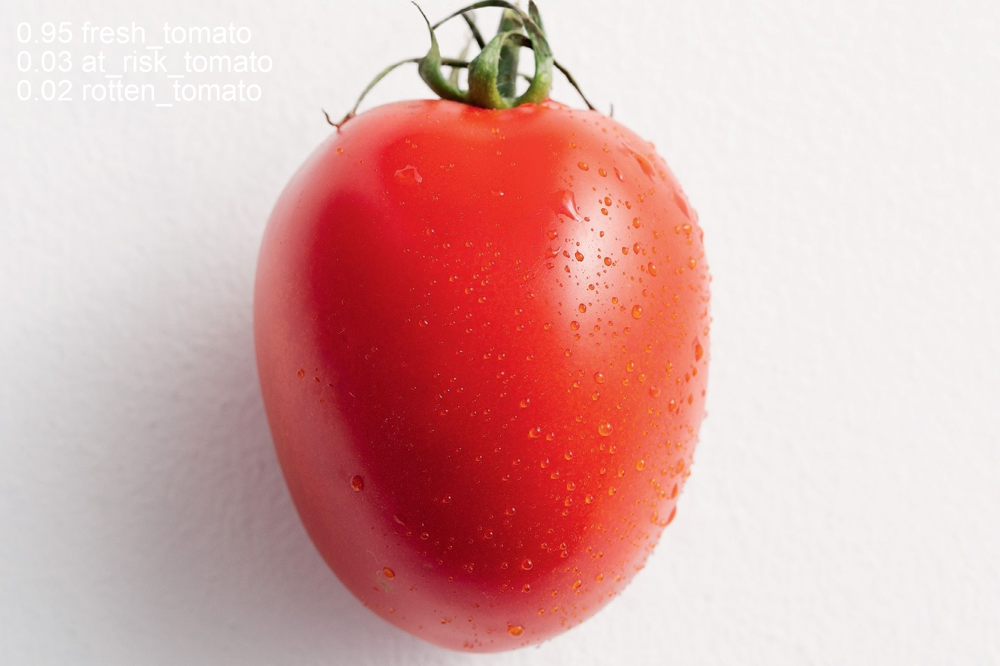

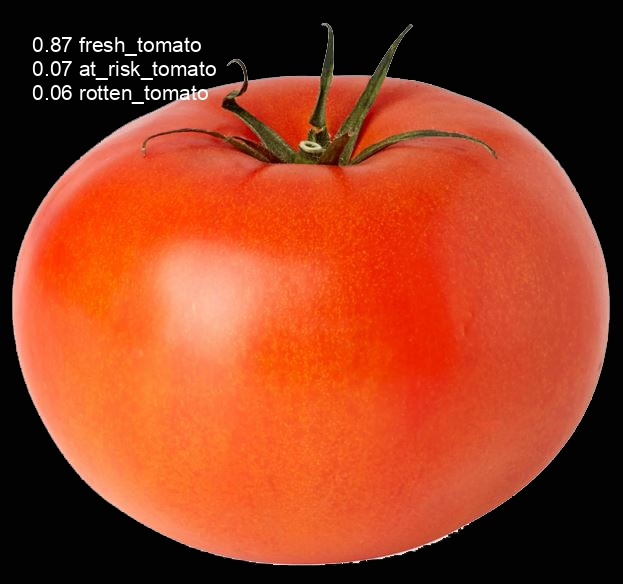

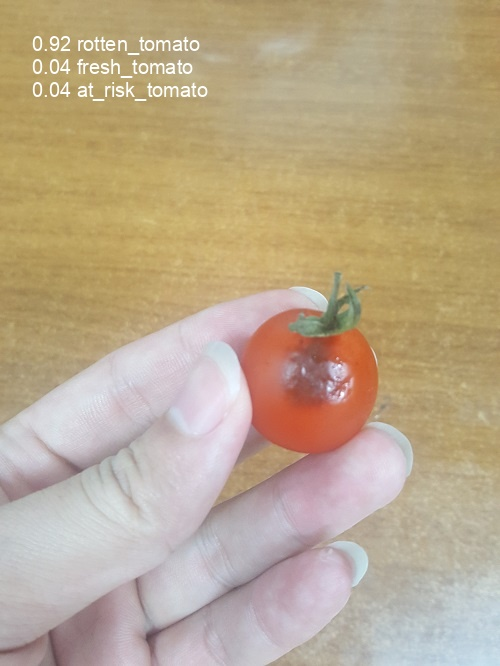

In [ ]:
import glob
from IPython.display import Image, display

i = 0

for imageName in glob.glob('/content/drive/MyDrive/yolov5_class/runs/predict-cls/exp8/*.jpg'):
  i +=1
  if i < 20:
    display(Image(filename=imageName))
    print("\n")

In [ ]:
import torch
from torch.utils.mobile_optimizer import optimize_for_mobile


#model = torch.load('/content/drive/MyDrive/yolov5_class/runs/train-cls/exp3/weights/best.pt',map_location="cpu")
#model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/yolov5_class/runs/train-cls/exp3/weights/best.pt', force_reload=True)
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/yolov5_class/runs/train-cls/exp6/weights/best.pt')
model.eval()
example = torch.rand(1, 3, 224, 224)
traced_script_module = torch.jit.trace(model, example)
optimized_traced_model = optimize_for_mobile(traced_script_module)
optimized_traced_model._save_for_lite_interpreter("300new_mobile_tomato_model.pt")

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2023-4-9 Python-3.10.11 torch-2.0.0+cu118 CPU

Fusing layers... 
Model summary: 166 layers, 11670035 parameters, 0 gradients, 30.6 GFLOPs
WARNING ⚠️ YOLOv5 ClassificationModel is not yet AutoShape compatible. You must pass torch tensors in BCHW to this model, i.e. shape(1,3,224,224).


In [ ]:
!python export.py --weights runs/train-cls/exp6/weights/best.pt --imgsz 224 --include onnx

export: data=data/coco128.yaml, weights=['runs/train-cls/exp6/weights/best.pt'], imgsz=[224], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['onnx']
YOLOv5 🚀 2023-4-9 Python-3.10.11 torch-2.0.0+cu118 CPU

Fusing layers... 
Model summary: 166 layers, 11670035 parameters, 0 gradients, 30.6 GFLOPs

PyTorch: starting from runs/train-cls/exp6/weights/best.pt with output shape (1, 3) (22.4 MB)

ONNX: starting export with onnx 1.13.1...
============= Diagnostic Run torch.onnx.export version 2.0.0+cu118 =============
verbose: False, log level: Level.ERROR
======================= 0 NONE 0 NOTE 0 WARNING 0 ERROR ========================

ONNX: export success ✅ 1.7s, saved as runs/train-cls/exp6/weights/best.onnx (44.5 MB)

Export complete (2.7s)
Results saved to /content/drive

In [ ]:
!pip install onnx2keras

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for onnx2keras: filename=onnx2keras-0.0.24-py3-none-any.whl size=24591 sha256=94e8462874f8ac49ee82d7e047506e0465a763230a9cb8d83f2376aca0d752c4
  Stored in directory: /root/.cache/pip/wheels/a1/fb/c9/349c27912022d104c7dd5f5d272595c33b1b959c4468d5e784
Successfully built onnx2keras


In [ ]:
import onnx
onnx_model = onnx.load("/content/drive/MyDrive/yolov5_class/runs/train-cls/exp6/weights/best.onnx")
from onnx2keras import onnx_to_keras
print(onnx_model.graph.input)
keras_model = onnx_to_keras(onnx_model, ['images'], verbose=False)
keras_model.save("300best.h5")

[name: "images"
type {
  tensor_type {
    elem_type: 1
    shape {
      dim {
        dim_value: 1
      }
      dim {
        dim_value: 3
      }
      dim {
        dim_value: 224
      }
      dim {
        dim_value: 224
      }
    }
  }
}
]


ValueError: ignored

In [ ]:
!python classify/train.py --model yolov5m-cls.pt --imgsz 224 --batch-size 128 --epochs 100 --data /content/drive/MyDrive/class_image_tomato --pretrained weights/yolov5m-cls.pt

classify/train: model=yolov5m-cls.pt, data=/content/drive/MyDrive/class_image_tomato, epochs=100, batch_size=128, imgsz=224, nosave=False, cache=None, device=, workers=8, project=runs/train-cls, name=exp, exist_ok=False, pretrained=weights/yolov5m-cls.pt, optimizer=Adam, lr0=1e-05, decay=5e-05, label_smoothing=0.1, cutoff=None, dropout=0.1, verbose=False, seed=0, local_rank=-1
github: skipping check (not a git repository), for updates see https://github.com/ultralytics/yolov5
YOLOv5 🚀 2023-4-9 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

TensorBoard: Start with 'tensorboard --logdir runs/train-cls', view at http://localhost:6006/
albumentations: RandomResizedCrop(p=1.0, height=224, width=224, scale=(0.08, 1.0), ratio=(0.75, 1.3333333333333333), interpolation=1), HorizontalFlip(p=0.5), ColorJitter(p=0.5, brightness=[0.6, 1.4], contrast=[0.6, 1.4], saturation=[0.6, 1.4], hue=[0, 0]), Normalize(p=1.0, mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=

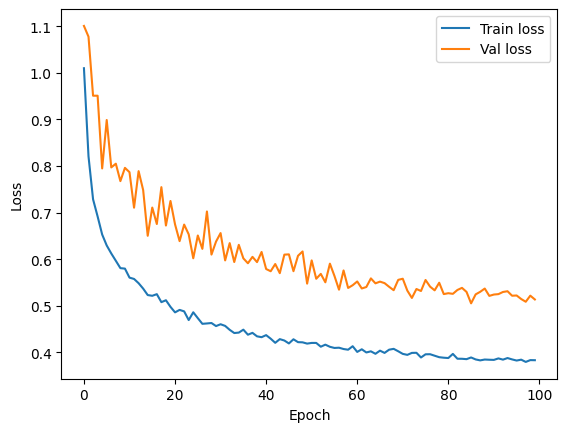

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Read CSV file into a pandas dataframe
df = pd.read_csv('/content/drive/MyDrive/yolov5_class/runs/train-cls/exp7/results.csv')

# Plot a line graph with epoch on the x-axis and train/loss and test/loss on the y-axis
plt.plot(df['                  epoch'], df['             train/loss'], label='Train loss')
plt.plot(df['                  epoch'], df['             valid/loss'], label='Val loss')

# Add axis labels and legend
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Display the graph
plt.show()

In [ ]:
!python classify/train.py --model yolov5m-cls.pt --imgsz 224 --batch-size 128 --epochs 100 --data /content/drive/MyDrive/class_image_tomato --pretrained weights/yolov5m-cls.pt

classify/train: model=yolov5m-cls.pt, data=/content/drive/MyDrive/class_image_tomato, epochs=100, batch_size=128, imgsz=224, nosave=False, cache=None, device=, workers=8, project=runs/train-cls, name=exp, exist_ok=False, pretrained=weights/yolov5m-cls.pt, optimizer=Adam, lr0=0.001, decay=5e-05, label_smoothing=0.1, cutoff=None, dropout=0.1, verbose=False, seed=0, local_rank=-1
github: skipping check (not a git repository), for updates see https://github.com/ultralytics/yolov5
YOLOv5 🚀 2023-4-9 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

TensorBoard: Start with 'tensorboard --logdir runs/train-cls', view at http://localhost:6006/
albumentations: RandomResizedCrop(p=1.0, height=224, width=224, scale=(0.08, 1.0), ratio=(0.75, 1.3333333333333333), interpolation=1), HorizontalFlip(p=0.5), ColorJitter(p=0.5, brightness=[0.6, 1.4], contrast=[0.6, 1.4], saturation=[0.6, 1.4], hue=[0, 0]), Normalize(p=1.0, mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=

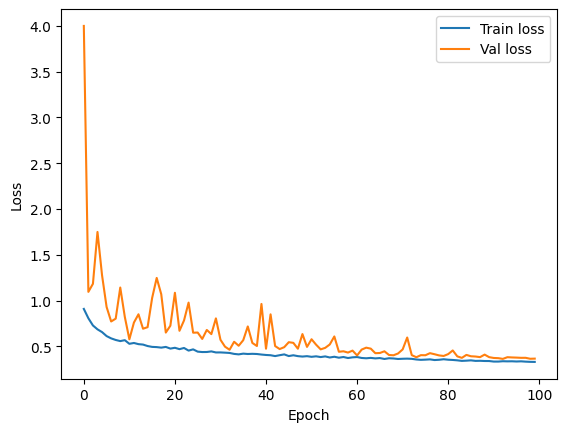

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Read CSV file into a pandas dataframe
df = pd.read_csv('/content/drive/MyDrive/yolov5_class/runs/train-cls/exp8/results.csv')

# Plot a line graph with epoch on the x-axis and train/loss and test/loss on the y-axis
plt.plot(df['                  epoch'], df['             train/loss'], label='Train loss')
plt.plot(df['                  epoch'], df['             valid/loss'], label='Val loss')

# Add axis labels and legend
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Display the graph
plt.show()

In [ ]:
!python classify/train.py --model yolov5m-cls.pt --imgsz 224 --batch-size 128 --epochs 300 --data /content/drive/MyDrive/class_image_tomato --pretrained weights/yolov5m-cls.pt

classify/train: model=yolov5m-cls.pt, data=/content/drive/MyDrive/class_image_tomato, epochs=300, batch_size=128, imgsz=224, nosave=False, cache=None, device=, workers=8, project=runs/train-cls, name=exp, exist_ok=False, pretrained=weights/yolov5m-cls.pt, optimizer=Adam, lr0=0.001, decay=5e-05, label_smoothing=0.1, cutoff=None, dropout=0.1, verbose=False, seed=0, local_rank=-1
github: skipping check (not a git repository), for updates see https://github.com/ultralytics/yolov5
YOLOv5 🚀 2023-4-9 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

TensorBoard: Start with 'tensorboard --logdir runs/train-cls', view at http://localhost:6006/
albumentations: RandomResizedCrop(p=1.0, height=224, width=224, scale=(0.08, 1.0), ratio=(0.75, 1.3333333333333333), interpolation=1), HorizontalFlip(p=0.5), ColorJitter(p=0.5, brightness=[0.6, 1.4], contrast=[0.6, 1.4], saturation=[0.6, 1.4], hue=[0, 0]), Normalize(p=1.0, mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=

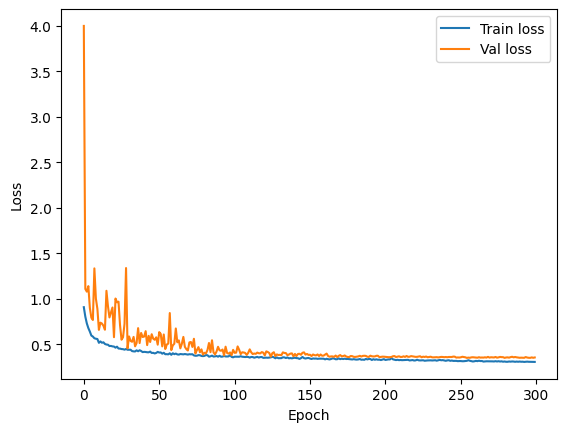

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Read CSV file into a pandas dataframe
df = pd.read_csv('/content/drive/MyDrive/yolov5_class/runs/train-cls/exp9/results.csv')

# Plot a line graph with epoch on the x-axis and train/loss and test/loss on the y-axis
plt.plot(df['                  epoch'], df['             train/loss'], label='Train loss')
plt.plot(df['                  epoch'], df['             valid/loss'], label='Val loss')

# Add axis labels and legend
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Display the graph
plt.show()

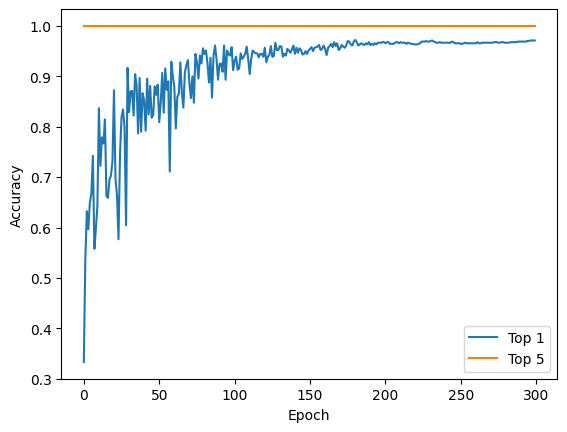

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Read CSV file into a pandas dataframe
df = pd.read_csv('/content/drive/MyDrive/yolov5_class/runs/train-cls/exp9/results.csv')

# Plot a line graph with epoch on the x-axis and train/loss and test/loss on the y-axis
plt.plot(df['                  epoch'], df['  metrics/accuracy_top1'], label='Top 1')
plt.plot(df['                  epoch'], df['  metrics/accuracy_top5'], label='Top 5')

# Add axis labels and legend
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Display the graph
plt.show()

In [ ]:
!python classify/val.py --weights runs/train-cls/exp9/weights/best.pt --imgsz 224 --data /content/drive/MyDrive/class_image_tomato

classify/val: data=/content/drive/MyDrive/class_image_tomato, weights=['runs/train-cls/exp9/weights/best.pt'], batch_size=128, imgsz=224, device=, workers=8, verbose=True, project=runs/val-cls, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 2023-4-9 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 166 layers, 11670035 parameters, 0 gradients, 30.6 GFLOPs
testing: 100% 8/8 [01:47<00:00, 13.46s/it]
                   Class      Images    top1_acc    top5_acc
                     all         900       0.994           1
          at_risk_tomato         300       0.987           1
            fresh_tomato         300           1           1
           rotten_tomato         300       0.997           1
Speed: 0.1ms pre-process, 1.1ms inference, 0.0ms post-process per image at shape (1, 3, 224, 224)
Results saved to runs/val-cls/exp8


In [ ]:
!python classify/train.py --model yolov5m-cls.pt --imgsz 224 --batch-size 128 --epochs 300 --data /content/drive/MyDrive/class_image_tomato --pretrained weights/yolov5m-cls.pt

classify/train: model=yolov5m-cls.pt, data=/content/drive/MyDrive/class_image_tomato, epochs=300, batch_size=128, imgsz=224, nosave=False, cache=None, device=, workers=8, project=runs/train-cls, name=exp, exist_ok=False, pretrained=weights/yolov5m-cls.pt, optimizer=Adam, lr0=0.01, decay=5e-05, label_smoothing=0.1, cutoff=None, dropout=0.1, verbose=False, seed=0, local_rank=-1
github: skipping check (not a git repository), for updates see https://github.com/ultralytics/yolov5
YOLOv5 🚀 2023-4-9 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

TensorBoard: Start with 'tensorboard --logdir runs/train-cls', view at http://localhost:6006/
albumentations: RandomResizedCrop(p=1.0, height=224, width=224, scale=(0.08, 1.0), ratio=(0.75, 1.3333333333333333), interpolation=1), HorizontalFlip(p=0.5), ColorJitter(p=0.5, brightness=[0.6, 1.4], contrast=[0.6, 1.4], saturation=[0.6, 1.4], hue=[0, 0]), Normalize(p=1.0, mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=2

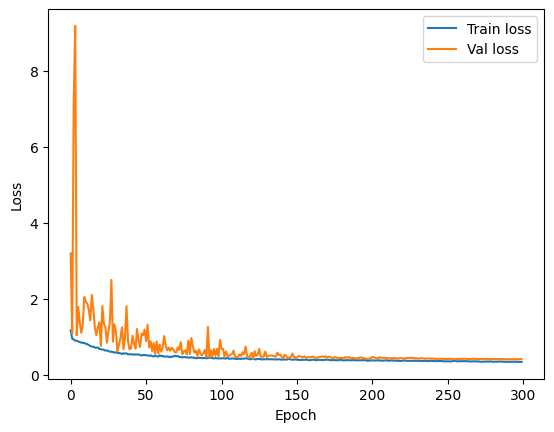

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Read CSV file into a pandas dataframe
df = pd.read_csv('/content/drive/MyDrive/yolov5_class/runs/train-cls/exp10/results.csv')

# Plot a line graph with epoch on the x-axis and train/loss and test/loss on the y-axis
plt.plot(df['                  epoch'], df['             train/loss'], label='Train loss')
plt.plot(df['                  epoch'], df['             valid/loss'], label='Val loss')

# Add axis labels and legend
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Display the graph
plt.show()

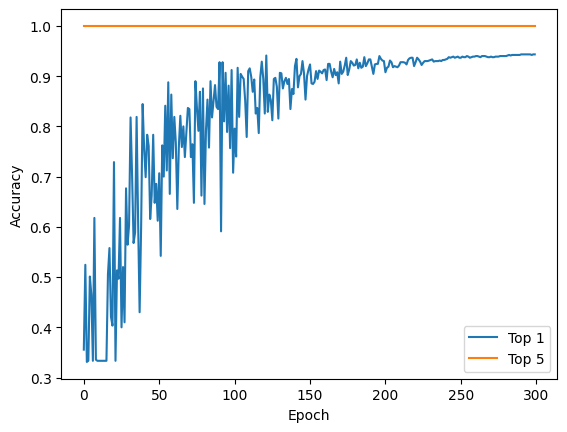

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Read CSV file into a pandas dataframe
df = pd.read_csv('/content/drive/MyDrive/yolov5_class/runs/train-cls/exp10/results.csv')

# Plot a line graph with epoch on the x-axis and train/loss and test/loss on the y-axis
plt.plot(df['                  epoch'], df['  metrics/accuracy_top1'], label='Top 1')
plt.plot(df['                  epoch'], df['  metrics/accuracy_top5'], label='Top 5')

# Add axis labels and legend
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Display the graph
plt.show()

In [ ]:
!python classify/val.py --weights runs/train-cls/exp10/weights/best.pt --imgsz 224 --data /content/drive/MyDrive/class_image_tomato

classify/val: data=/content/drive/MyDrive/class_image_tomato, weights=['runs/train-cls/exp10/weights/best.pt'], batch_size=128, imgsz=224, device=, workers=8, verbose=True, project=runs/val-cls, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 2023-4-9 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 166 layers, 11670035 parameters, 0 gradients, 30.6 GFLOPs
testing: 100% 8/8 [01:41<00:00, 12.65s/it]
                   Class      Images    top1_acc    top5_acc
                     all         900       0.991           1
          at_risk_tomato         300       0.987           1
            fresh_tomato         300           1           1
           rotten_tomato         300       0.987           1
Speed: 0.1ms pre-process, 1.2ms inference, 0.0ms post-process per image at shape (1, 3, 224, 224)
Results saved to runs/val-cls/exp9


In [4]:
!python classify/train.py --model yolov5m-cls.pt --imgsz 224 --batch-size 128 --epochs 200 --data /content/drive/MyDrive/class_image_tomato --pretrained weights/yolov5m-cls.pt

classify/train: model=yolov5m-cls.pt, data=/content/drive/MyDrive/class_image_tomato, epochs=200, batch_size=128, imgsz=224, nosave=False, cache=None, device=, workers=8, project=runs/train-cls, name=exp, exist_ok=False, pretrained=weights/yolov5m-cls.pt, optimizer=Adam, lr0=0.001, decay=5e-05, label_smoothing=0.1, cutoff=None, dropout=0.1, verbose=False, seed=0, local_rank=-1
github: skipping check (not a git repository), for updates see https://github.com/ultralytics/yolov5
YOLOv5 🚀 2023-4-9 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

TensorBoard: Start with 'tensorboard --logdir runs/train-cls', view at http://localhost:6006/
albumentations: RandomResizedCrop(p=1.0, height=224, width=224, scale=(0.08, 1.0), ratio=(0.75, 1.3333333333333333), interpolation=1), HorizontalFlip(p=0.5), ColorJitter(p=0.5, brightness=[0.6, 1.4], contrast=[0.6, 1.4], saturation=[0.6, 1.4], hue=[0, 0]), Normalize(p=1.0, mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=

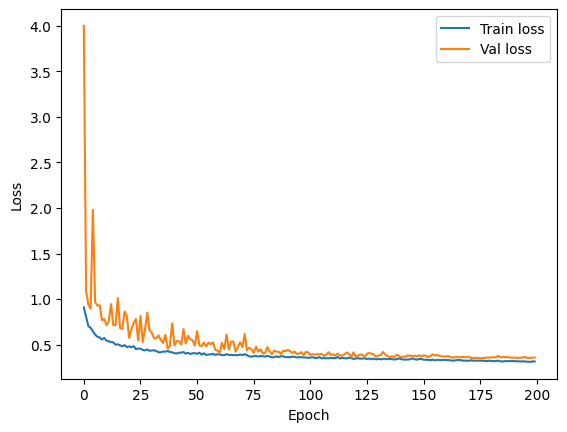

In [5]:
import pandas as pd
import matplotlib.pyplot as plt

# Read CSV file into a pandas dataframe
df = pd.read_csv('/content/drive/MyDrive/yolov5_class/runs/train-cls/exp11/results.csv')

# Plot a line graph with epoch on the x-axis and train/loss and test/loss on the y-axis
plt.plot(df['                  epoch'], df['             train/loss'], label='Train loss')
plt.plot(df['                  epoch'], df['             valid/loss'], label='Val loss')

# Add axis labels and legend
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Display the graph
plt.show()

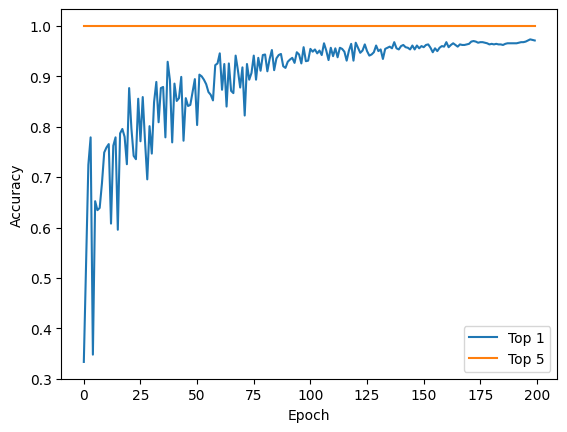

In [6]:
import pandas as pd
import matplotlib.pyplot as plt

# Read CSV file into a pandas dataframe
df = pd.read_csv('/content/drive/MyDrive/yolov5_class/runs/train-cls/exp11/results.csv')

# Plot a line graph with epoch on the x-axis and train/loss and test/loss on the y-axis
plt.plot(df['                  epoch'], df['  metrics/accuracy_top1'], label='Top 1')
plt.plot(df['                  epoch'], df['  metrics/accuracy_top5'], label='Top 5')

# Add axis labels and legend
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Display the graph
plt.show()

In [7]:
!python classify/val.py --weights runs/train-cls/exp11/weights/best.pt --imgsz 224 --data /content/drive/MyDrive/class_image_tomato

classify/val: data=/content/drive/MyDrive/class_image_tomato, weights=['runs/train-cls/exp11/weights/best.pt'], batch_size=128, imgsz=224, device=, workers=8, verbose=True, project=runs/val-cls, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 2023-4-9 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 166 layers, 11670035 parameters, 0 gradients, 30.6 GFLOPs
testing: 100% 8/8 [01:44<00:00, 13.05s/it]
                   Class      Images    top1_acc    top5_acc
                     all         900       0.994           1
          at_risk_tomato         300       0.983           1
            fresh_tomato         300           1           1
           rotten_tomato         300           1           1
Speed: 0.1ms pre-process, 1.5ms inference, 0.0ms post-process per image at shape (1, 3, 224, 224)
Results saved to runs/val-cls/exp10


Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 2023-4-9 Python-3.10.11 torch-2.0.0+cu118 CPU

Fusing layers... 
Model summary: 166 layers, 11670035 parameters, 0 gradients, 30.6 GFLOPs
WARNING ⚠️ YOLOv5 ClassificationModel is not yet AutoShape compatible. You must pass torch tensors in BCHW to this model, i.e. shape(1,3,224,224).


Accuracy:  0.9944444444444445
Recall at_risk_tomato:  0.9833333333333333
Precision at_risk_tomato:  0.9833333333333333
F1-Score at_risk_tomato:  0.9915966386554621
Recall fresh_tomato:  1.0
Precision fresh_tomato:  1.0
F1-Score fresh_tomato:  1.0
Recall rotten_tomato:  1.0
Precision rotten_tomato:  1.0
F1-Score rotten_tomato:  0.9917355371900827
Confusion Matrix: 
 [[295   0   5]
 [  0 300   0]
 [  0   0 300]]


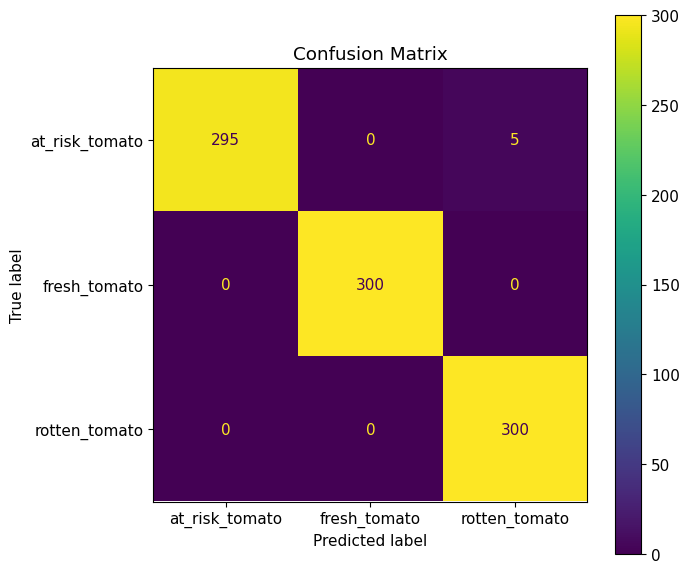

In [4]:
import torch
import torchvision
from torchvision import transforms
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from IPython.display import display
import numpy as np
import matplotlib.pyplot as plt

# Define the transforms to apply to the images
transform = transforms.Compose([transforms.Resize((224, 224)),
                                transforms.ToTensor(),
                                transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))])

# Load the test set
testset = torchvision.datasets.ImageFolder(root='/content/drive/MyDrive/class_image_tomato/test/', transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=128, shuffle=False)

# Load the YOLOv5 model
#model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/yolov5_class/runs/train-cls/exp11/weights/best.pt')

# Initialize variables for calculating evaluation metrics
y_true = []
y_pred = []

# Loop over test dataset and generate predictions
for image, label in testloader:
  
    # Generate prediction
    result = model(image)

    # Extract predicted class label
    predicted_labels = torch.argmax(result, dim=1).numpy()

    # Append true and predicted labels to lists
    y_true.append(label.numpy())
    y_pred.append(predicted_labels)

# Concatenate the list of predicted labels and true labels
y_true = np.concatenate(y_true)
y_pred = np.concatenate(y_pred)

# Define the class names
class_names = ['at_risk_tomato', 'fresh_tomato', 'rotten_tomato']

# Calculate evaluation metrics
accuracy = np.mean(np.array(y_true) == np.array(y_pred))
#report = confusion_matrix(y_true, y_pred, labels=np.arange(len(class_names)), normalize='true')

report = classification_report(y_true, y_pred)
cm = confusion_matrix(y_true, y_pred)

# Extract recall, precision and f1-score from classification report
report = classification_report(y_true, y_pred, target_names=class_names, output_dict=True)
recall_class_1 = report['at_risk_tomato']['recall']
precision_class_1 = report['at_risk_tomato']['precision']
f1_score_class_1 = report['at_risk_tomato']['f1-score']

recall_class_2 = report['fresh_tomato']['recall']
precision_class_2 = report['fresh_tomato']['precision']
f1_score_class_2 = report['fresh_tomato']['f1-score']

recall_class_3 = report['rotten_tomato']['recall']
precision_class_3 = report['rotten_tomato']['precision']
f1_score_class_3 = report['rotten_tomato']['f1-score']


#metrics = classification_report(y_true, y_pred, output_dict=True)
#recall = metrics['weighted avg']['recall']
#precision = metrics['weighted avg']['precision']
#f1_score = metrics['weighted avg']['f1-score']

# Display results
print("Accuracy: ", accuracy)

print("Recall at_risk_tomato: ", recall_class_1)
print("Precision at_risk_tomato: ", recall_class_1)
print("F1-Score at_risk_tomato: ", f1_score_class_1)


print("Recall fresh_tomato: ", recall_class_2)
print("Precision fresh_tomato: ", recall_class_2)
print("F1-Score fresh_tomato: ", f1_score_class_2)

print("Recall rotten_tomato: ", recall_class_3)
print("Precision rotten_tomato: ", recall_class_3)
print("F1-Score rotten_tomato: ", f1_score_class_3)

print("Confusion Matrix: \n", cm)



# Define the confusion matrix data
#confusion_matrix = np.array([[300, 0, 0],
                    #[0, 300, 0],
                    #[0, 0, 300]])

# Define the labels for the classes
labels = ['at_risk_tomato', 'fresh_tomato', 'rotten_tomato']

# Create a new figure and set its size
fig, ax = plt.subplots(figsize=(7, 7))

# Create a confusion matrix display
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)

# Plot the confusion matrix display
disp.plot(ax=ax)

# Set the title of the plot
ax.set_title("Confusion Matrix")

# Show the plot
plt.show()
display(fig)

In [5]:
!python classify/predict.py --weights runs/train-cls/exp11/weights/best.pt --imgsz 224 --source '/content/drive/MyDrive/yolov5_class/test/*.jpg'

classify/predict: weights=['runs/train-cls/exp11/weights/best.pt'], source=/content/drive/MyDrive/yolov5_class/test/*.jpg, data=data/coco128.yaml, imgsz=[224, 224], device=, view_img=False, save_txt=False, nosave=False, augment=False, visualize=False, update=False, project=runs/predict-cls, name=exp, exist_ok=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 2023-4-9 Python-3.10.11 torch-2.0.0+cu118 CPU

Fusing layers... 
Model summary: 166 layers, 11670035 parameters, 0 gradients, 30.6 GFLOPs
image 1/9 /content/drive/MyDrive/yolov5_class/test/test01.jpg: 224x224 at_risk_tomato 0.93, rotten_tomato 0.05, fresh_tomato 0.02, 91.8ms
image 2/9 /content/drive/MyDrive/yolov5_class/test/test02.jpg: 224x224 at_risk_tomato 0.94, fresh_tomato 0.03, rotten_tomato 0.03, 83.3ms
image 3/9 /content/drive/MyDrive/yolov5_class/test/test03.jpg: 224x224 at_risk_tomato 0.94, fresh_tomato 0.03, rotten_tomato 0.03, 128.0ms
image 4/9 /content/drive/MyDrive/yolov5_class/test/test04.jpg: 224x224 at_risk_tomat

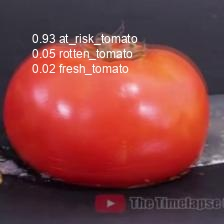

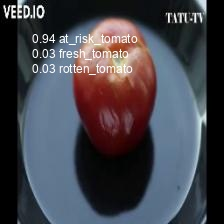

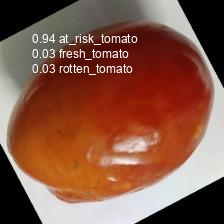

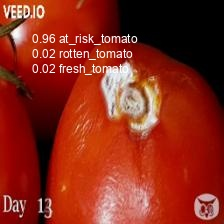

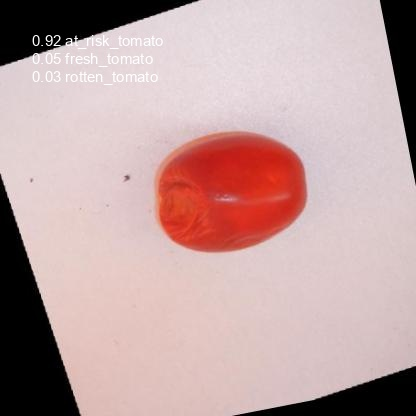

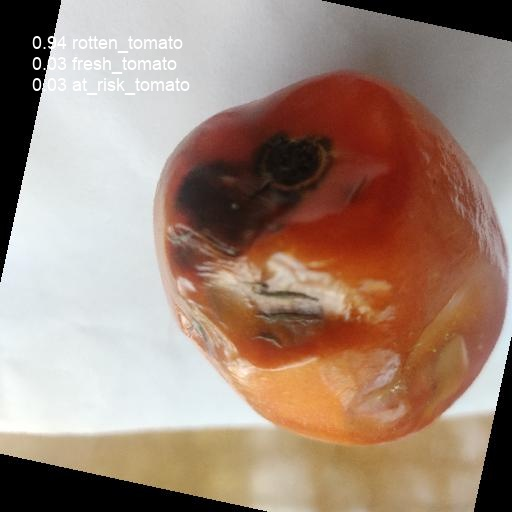

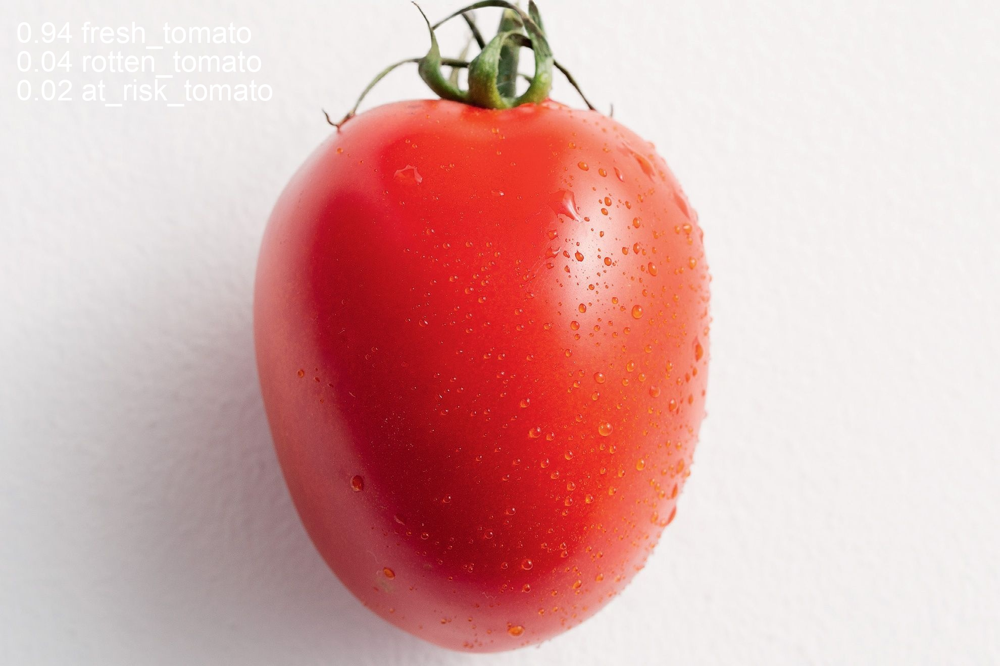

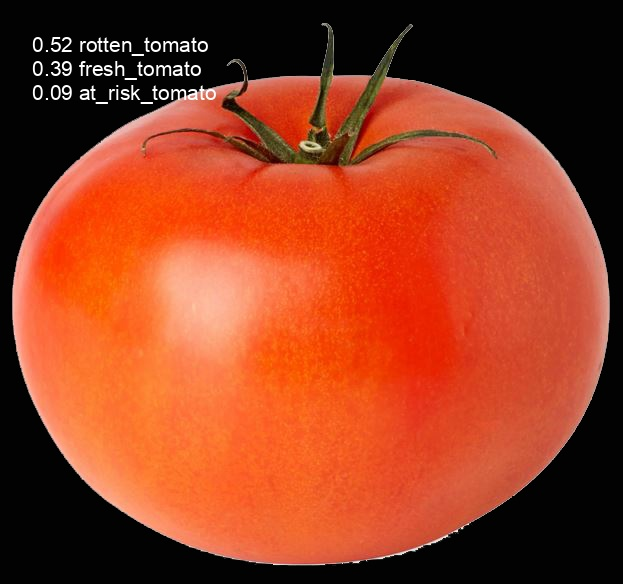

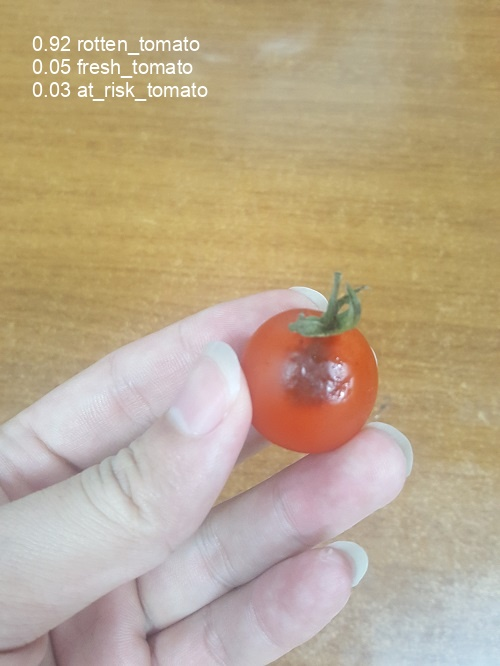

In [6]:
import glob
from IPython.display import Image, display

i = 0

for imageName in glob.glob('/content/drive/MyDrive/yolov5_class/runs/predict-cls/exp9/*.jpg'):
  i +=1
  if i < 20:
    display(Image(filename=imageName))
    print("\n")

In [7]:
import torch
from torch.utils.mobile_optimizer import optimize_for_mobile


#model = torch.load('/content/drive/MyDrive/yolov5_class/runs/train-cls/exp3/weights/best.pt',map_location="cpu")
#model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/yolov5_class/runs/train-cls/exp3/weights/best.pt', force_reload=True)
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/yolov5_class/runs/train-cls/exp11/weights/best.pt')
model.eval()
example = torch.rand(1, 3, 224, 224)
traced_script_module = torch.jit.trace(model, example)
optimized_traced_model = optimize_for_mobile(traced_script_module)
optimized_traced_model._save_for_lite_interpreter("finalnew_mobile_tomato_model.pt")

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2023-4-9 Python-3.10.11 torch-2.0.0+cu118 CPU

Fusing layers... 
Model summary: 166 layers, 11670035 parameters, 0 gradients, 30.6 GFLOPs
WARNING ⚠️ YOLOv5 ClassificationModel is not yet AutoShape compatible. You must pass torch tensors in BCHW to this model, i.e. shape(1,3,224,224).
